# Capstone Project  
# The Battle of the Neighborhoods (Week 2)
### Applied Data Science Capstone by IBM/Coursera

**Table of contents**
* [Introduction: Business Problem](#introduction)
* [Methodology](#methodology)
* [Data Preprocessing](#data)
* [Data Analysis](#analysis)
* [Clustering Model](#clustering)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

## Introduction: Business Problem <a name="introduction"></a>

The thriving restaurant sector is growing at a great rate throughout Metropolitan Lima area. In this sector, there are different categories or types of restaurants due to the diversification of people's tastes and specific foods.

But how much do we know about these categories and their distribution in our metropolitan area? Which are the mains?  Is it possible to classify the metropolitan districts of Lima according to these categories? In this project we will use data science to answer these questions.

This project is aimed both the public interested on finding these answers and the Lima's people who want to start their medium or small business and want to find out what type of restaurant business is right in their district.


## Methodology <a name="methodology"></a>

For this project, we will direct our efforts to answer the questions of the commercial problem, we will find the distribution of the types of restaurants by the districts and subregions (groups of districts) which make up the Lima metropolitan area and obtain the main categories of restaurants, then we will cluster the types/categories of restaurants to generate a new classification of Lima Metropolitan area.

The project methodology is shown below:
* Data Preprocessing
  * Data Reduction: Feature selection of the primary data to obtain districts of Lima Metropolitan
  * Data Collecting: Collecting metadata of a sample of restaurants 
  * Data Cleaning: Resolving conflicts between data and drop duplicates

* Data Analysis
  * Normalization of the restaurant categories
  * Classification map of the Lima Metropolitan area by districts and subregions
  * Obtaining the main restaurant categories by districts and subregions 
  * Heat map of the main restaurant categories
  
  
* Clustering Model
    * Linear Dimensional Reduction by PCA using SVD
    * Internal validation metrics to choose the optimal k
    * K-Means Clustering Algorithm 
    * Mapping K-Means clusters



## Data Preprocessing

### Primary Data <a name="data"></a>

Based on definition of our problem,we will need a shapefile file of the Peruvian districts where are the  Lima Metropolitan districts, this will provide us with a relevant geographic information that is available at the following [link](https://drive.google.com/file/d/19NlT3dNlPO_ismoXg55rmZdIVT7K4RxY/view) provided by the [National Geographic Institute of Peru](https://www.geogpsperu.com/2018/02/limite-distrital-politico-shapefile-ign.html).

### Data Reduction

Data downloaded is a spatial data file where is found the Peruvian districts geometry, therefore, we only select the Lima Metropolitan districts of our primary source  (IGN) through ArcGIS site packages in Python like arcgis and arcpy.<br>

In [9]:
# When working with geospatial data, must define your workspaces

    ## Libraries used
import arcpy
from arcpy import env

    ## Define your workspace
workspace = r"C:\Users\jf_ph\Documents\SATELLITE IMAGES\SHAPEFILE"
outworkspace = r"C:\Users\jf_ph\Documents\SATELLITE IMAGES\RESULTS\feature_class"

    ## Define Output Coordinate System 
env.outputCoordinateSystem = arcpy.SpatialReference("WGS 1984")

In [42]:
# We select only features belong to Lima Metropolitan districts.
import os

    ## Parameters for this tool
inFeatures = os.path.join(workspace, "DISTRITOS.shp")
outLocation = workspace
outFeatureClass = "lima_callao.shp"
        ### Expression to select these features ###
where_clause =""""PROVINCIA" = 'LIMA' or "PROVINCIA" = 'CALLAO'"""

    ## Execute FeatureClassToFeatureClass tool
arcpy.FeatureClassToFeatureClass_conversion(inFeatures, outLocation, 
                                 outFeatureClass, where_clause)

<Result 'C:\\Users\\jf_ph\\Documents\\SATELLITE IMAGES\\SHAPEFILE\\lima_callao.shp'>

### Data Collecting

Once selected the districts, we need a sample of restaurants to analyze, for this reason we will create uniform fishnet points over Lima Metropolitan area, in total were 4,964 points according to [Rate Limits in Foursquare](https://developer.foursquare.com/docs/places-api/rate-limits/).

These points will feed the Foursquare API that  will recommend up to 50 restaurants for each fishnet point in a assigned radius  of 1250 meters to completely cover the Lima Metropolitan area.

In [43]:
# We create uniform fishnet points over Lima Metropolitan area

    ## Describes the feature extent
input_feature = os.path.join(workspace, "lima_callao.shp")
obj = arcpy.Describe(input_feature)
obj.extent

    ## Parameters
output_feature =  os.path.join(outworkspace, "fishnet.shp")
cellSizeWidth = '0'
cellSizeHeight = '0'
numRows =  '108'
numColumns = '109'
labels = 'LABELS' # To obtain the fishnet label points
templateExtent = ' '
geometryType = 'POLYGON'
        ### Defining the fishnet extent from our feature extent ###
originCoordinate = str(obj.extent.XMin) + ' ' + str(obj.extent.YMin) 
yAxisCoordinate = str(obj.extent.XMin) + ' ' + str(obj.extent.YMin + 10)
oppositeCoorner = str(obj.extent.XMax) + ' ' + str(obj.extent.YMax)

    ## Execute Create Fishnet tool with ordered parameters
arcpy.CreateFishnet_management(output_feature, originCoordinate, yAxisCoordinate,
                               cellSizeWidth, cellSizeHeight, numRows, numColumns,
                               oppositeCoorner, labels, templateExtent, geometryType)

<Result 'C:\\Users\\jf_ph\\Documents\\SATELLITE IMAGES\\RESULTS\\feature_class\\fishnet.shp'>

In [44]:
# The points included in the Lima Metropolitan area are spatially joined with the attributes of this feature.

    ##Parameters
        ### fishnet_label is the feature of points from Create Fishnet ##
targetFeatures = os.path.join(outworkspace, "fishnet_label.shp") 
joinFeatures = input_feature
outfc = os.path.join(outworkspace, "fishnet_spatial_join.shp")
join_operation = 'JOIN_ONE_TO_MANY'
join_type = 'KEEP_COMMON'
        ### Joining the different feature attributes ###
fieldmappings = arcpy.FieldMappings()
fieldmappings.addTable(targetFeatures)
fieldmappings.addTable(input_feature)

    ## Execute Spatial Join tool 
arcpy.SpatialJoin_analysis(targetFeatures, joinFeatures, outfc,
                           join_operation, join_type, fieldmappings)

<Result 'C:\\Users\\jf_ph\\Documents\\SATELLITE IMAGES\\RESULTS\\feature_class\\fishnet_spatial_join.shp'>

In [13]:
# Accessing to  attribute tables of fishnet points and Lima Metropolitan districts
from arcgis.features import GeoAccessor, GeoSeriesAccessor

# Accessing to attribute tables only with the required columns: Districts and geometry shape
fishnet = GeoAccessor.from_featureclass(outfc)[['DISTRITO','SHAPE']]
lima_callao = GeoAccessor.from_featureclass(input_feature)[['DISTRITO','SHAPE']]

In [181]:
fishnet.head()

,DISTRITO,SHAPE
0,PUCUSANA,"{'x': -76.78785480882101, 'y': -12.51554491685..."
1,PUCUSANA,"{'x': -76.79845991661917, 'y': -12.50677154055..."
2,PUCUSANA,"{'x': -76.79315736272008, 'y': -12.50677154055..."
3,PUCUSANA,"{'x': -76.79845991661917, 'y': -12.49799816425..."
4,PUCUSANA,"{'x': -76.79315736272008, 'y': -12.49799816425..."


####  Getting a metadata of restaurant  in Foursquare API

Consists in getting and save in a dataframe the metadata such as categories, name, latitude and longitude of the sample of restaurants obtained through Foursquare Api with our fishnet points 

In [62]:
# To obtain the latitude and longitude of our fishnet points
coordinates = []
for i in range(0,len(fishnet)):
    coordinates.append((fishnet.SHAPE.to_dict()[i]['x'],fishnet.SHAPE.to_dict()[i]['y']))  
f_points = pd.DataFrame(coordinates, columns = ['Longitude','Latitude'])

In [63]:
f_points.tail()

,Longitude,Latitude
4960,-77.047680,-11.585567
4961,-77.042377,-11.585567
4962,-77.074193,-11.576794
4963,-77.068890,-11.576794
4964,-77.052983,-11.576794


In [64]:
# Userless Authentication in Foursquare API
CLIENT_ID = '3TIW31NEOSEZUO0WHOYZORKYOIUNCGJW2GQHYSDJECD0OAUY' # your Foursquare ID
CLIENT_SECRET = 'NUYQ55ENP3VZ1ICCYABOMOZYDU1COR01LL10D1FSZACTFTXF'# your Foursquare Secret
VERSION = '20200413'
LIMIT = 50
section = 'food' # only food section 
    ## This radius generates a buffer that completely cover the Lima Metropolitan area ##
radius = 1250 #in meters
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 3TIW31NEOSEZUO0WHOYZORKYOIUNCGJW2GQHYSDJECD0OAUY
CLIENT_SECRET:NUYQ55ENP3VZ1ICCYABOMOZYDU1COR01LL10D1FSZACTFTXF


In [699]:
# Get metadata for a sample of restaurants through the Foursquare API
import requests  # library to handle requests
import json # library to handle JSON files
#---
restaurants_list=[]
for  name, lat, lng  in zip(fishnet.DISTRITO, f_points.Latitude, f_points.Longitude):
  # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&section={}&limit={}'.format(
          CLIENT_ID, 
          CLIENT_SECRET, 
          VERSION, 
          lat, 
          lng, 
          radius,
          section,
          LIMIT)
          # make the GET request
        results = requests.get(url).json()
        results = results["response"]['groups'][0]['items']

          # return only relevant information for each restaurant
        restaurants_list.append([( name,
              lat, 
              lng,
              v['venue']['name'], 
              v['venue']['location']['lat'], 
              v['venue']['location']['lng'],  
              v['venue']['categories'][0]['name']) for v in results])

restaurants = pd.DataFrame([item for restaurant_list in restaurants_list for item in restaurants_list])
restaurants.columns = [ 'DISTRITO', 
        'Restaurant', 
        'Restaurant Latitude', 
        'Restaurant Longitude', 
        'Restaurant Category']

restaurants.tail() 

,DISTRITO,Restaurant,Restaurant Latitude,Restaurant Longitude,Restaurant Category
20019,ANCON,"Recepciones ""Techy""",-11.735772,-77.169655,Peruvian Restaurant
20020,ANCON,"Recepciones ""Techy""",-11.735772,-77.169655,Peruvian Restaurant
20021,ANCON,La Granja Arakaki - Ancón,-11.734044,-77.146890,Fried Chicken Joint
20022,ANCON,La Granja Arakaki - Ancón,-11.734044,-77.146890,Fried Chicken Joint
20023,ANCON,La Granja Arakaki - Ancón,-11.734044,-77.146890,Fried Chicken Joint


### Data Cleaning

Consists in cleaning the metadata (category, name, latitude and longitude) of the sample of restaurants saved in a dataframe and obtained through the Foursquare API feeded with our fishnet points. 

For it, we verify if restaurant locations are contained in respective district and then drop the duplicate records to obtain a definitive dataframe with 5189 restaurants and 85 unique categories.

In [67]:
# Create a shapely.geometry.point for each restaurant coordinate
from shapely.geometry import Point
point = [Point(i) for i in zip(restaurants['Restaurant Longitude'], restaurants['Restaurant Latitude'])]

In [68]:
# Verifying if the restaurant coordinate is contained in respective district
lista = []
for e in range(len(lima_callao)):
    for i in range(len(point)):
        if list(GeoSeriesAccessor(lima_callao.SHAPE).as_shapely)[e].contains(point[i]):
            lista.append(restaurants.iloc[i,])
        else:    
            ## To correct district assignment errors
            restaurants['DISTRITO'][i] = lima_callao['DISTRITO'][e]
        ## To append those records that don't comply  the conditional    
            lista.append(restaurants.iloc[i,])         
            
#Create a dataframe from "lista" 
contains = pd.DataFrame(lista, columns = ['DISTRITO', 'Restaurant','Restaurant Latitude',
                                          'Restaurant Longitude', 'Restaurant Category'])     
contains.index = range(len(contains.index))           

In [702]:
# Dropping duplicate records to obtain a definitive dataframe
df_rest = contains.drop_duplicates(['Restaurant Latitude', 'Restaurant Longitude'], keep='first')
df_rest.index =  range(len(df_rest.index))
df_rest.tail()

,DISTRITO,Restaurant,Restaurant Latitude,Restaurant Longitude,Restaurant Category
5184,MI PERU,Leña y Carbón,-11.856287,-77.124710,Fried Chicken Joint
5185,MI PERU,Chifa Fu Wa,-11.856232,-77.124803,Chinese Restaurant
5186,MI PERU,Don Florencio,-11.855235,-77.125094,Restaurant
5187,MI PERU,Restaurante Luciana,-11.854221,-77.124896,Peruvian Restaurant
5188,MI PERU,Sangucheria D'mari,-11.850836,-77.121755,Burger Joint


In [183]:
print('In our sample there are {} restaurants with {} uniques categories.'.format(len(df_rest),len(df_rest['Restaurant Category'].unique())))

In our sample there are 5189 restaurants with 85 uniques categories.


## Data Analysis <a name="analysis"></a>

We will analyze both spatial data of Lima Metropolitan like the sample of restaurants data to answer the first two questions of the project. 

In this part you will find how types of restaurants are distributed throughout the metropolitan area by districts and subregions (groups of districts) and which are the main types/ categories of restaurants. Let's get started

### Min Max Normalization of the restaurant categories

In [187]:
# We normalize  the number of restaurants by categories through Min Max Method   
data = df_rest.groupby('Restaurant Category').count()['DISTRITO']
dataNorm=((data-data.min())/(data.max()-data.min()))

    ## Removing those records that when normalized are equal to zero
dataNorm= dataNorm[dataNorm > 0]
dataNorm = dataNorm.sort_values(ascending = True)
len(dataNorm)

68

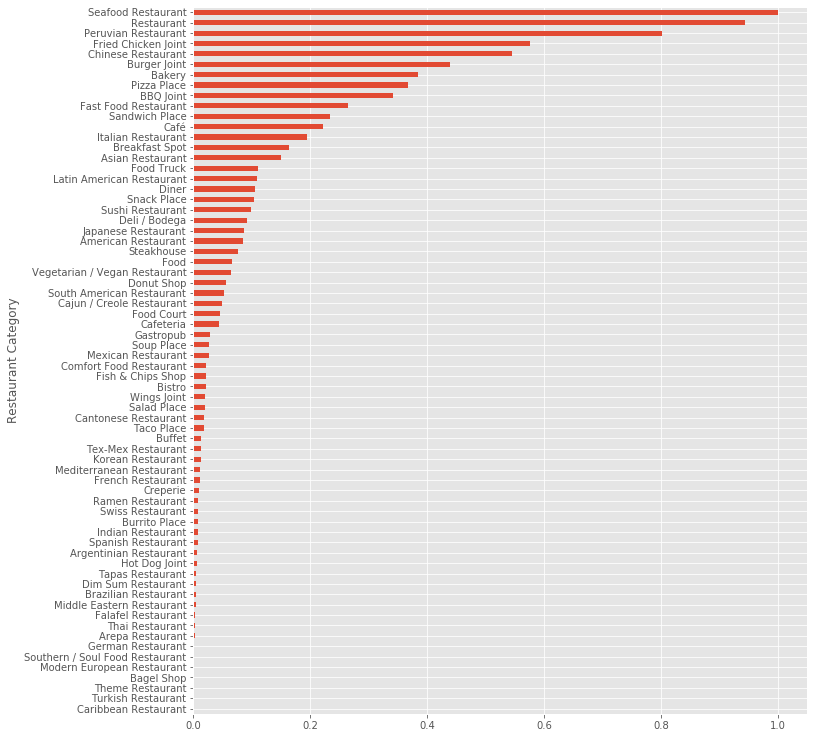

In [188]:
# Showing the normalization in a bar plot
import matplotlib.pyplot as plt
dataNorm.plot(kind = 'barh', figsize= (11,13), rot=0)
plt.style.use('ggplot')

#### Interpreting results

From this graph we can comment Seafood Restaurant is the category of restaurant with the most presence in Metropolitan Lima according to our sample of 5189 restaurants and 68 categories of 85 (excluding the minimums that when normalized obtained 0). 

Doing a statistical summarize it was found that seven types of restaurants are above the 90th percentile (0.373), this mean that are greater than 90% of the data, and fifteen categories are above the mean (with 0.121), the data have a median of 0.024 and there is a positive bias since the standard deviation (0.212) is greater than the mean, which corroborates the aforementioned, we have  few "high" values and many "low" values.

In [5]:
#Summarize data
print('90%',dataNorm.quantile(q = 0.90).round(6), sep = '\t  ') # Show the value of 90th percentil
print(dataNorm.describe())

90%	  0.372654
count    68.000000
mean      0.121454
std       0.215990
min       0.001618
25%       0.008091
50%       0.024272
75%       0.105987
max       1.000000
Name: Restaurant Longitude, dtype: float64


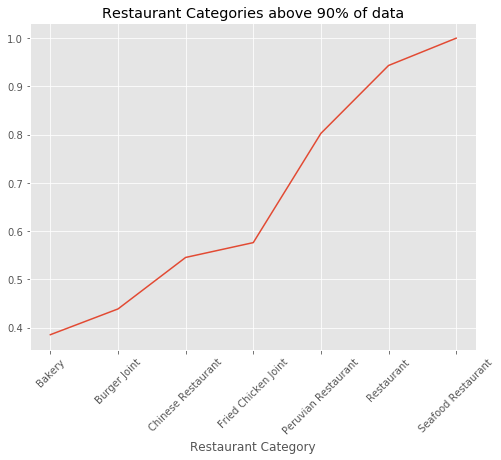

In [6]:
# Plotting the types of restaurants above the 90th percentile
dataNorm[dataNorm > dataNorm.quantile(q = 0.90)].plot(figsize= (8,6), rot=45)
plt.title('Restaurant Categories above 90% of data')
plt.show()

### Classification map of the Lima Metropolitan area by districts and subregions 

The classification of the Lima metropolitan area is one of the most important steps in this project, since this will allow us to know how are distributed the types of restaurants.

We will classify them by districts (territories divided politically) and subregions (groups of districts divided by their geography, population and economic-social condition), to know how different they can be gastronomically  talking

In [49]:
# To obtain the latitude, longitude of Metropolitan Lima 
from geopy.geocoders import Nominatim
address = 'Lima,Perú'

geolocator = Nominatim(user_agent = 'googlemaps')
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Lima are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Lima are -12.0621065, -77.0365256.


#### By districts

Lima Metropolitan  is made up of 50 districts of which 6 belong to the Constitutional Province of Callao.

In [750]:
# To modify the style of the folium map
style_function = lambda feature: dict(color = 'blue', fillColor='blue', 
                                      weight=1.5, opacity=0.5, fillOpacity = 0.05)
# To obtain extent, tooltip (district name) and style of each district
district_ext = []
for i in range(len(lima_callao)):
    district_ext.append(folium.features.GeoJson(GeoSeriesAccessor(lima_callao.SHAPE).as_shapely[i], 
                                                tooltip= lima_callao['DISTRITO'][i],
                                                style_function = style_function))

In [751]:
# To show the folium map
# You can know the district name when hovering over the feature
import folium # map rendering library
map_lima = folium.Map(location=[latitude, longitude], zoom_start=11)
for polygon in district_ext:
    polygon.add_to(map_lima)
map_lima    

#### By subregions

Lima's population is geographically divided in six subregions: Lima Norte (turquoise), Lima Sur (red), Lima Este (yellow), Callao (orange), Central Lima (blue) and Residential Lima (purple).

In [7]:
# Map our study area by its geographical division in six zones
north = ['ANCON','CARABAYLLO','SANTA ROSA', 'PUENTE PIEDRA','COMAS','LOS OLIVOS','INDEPENDENCIA','SAN MARTIN DE PORRES']
callao = ['CALLAO','VENTANILLA','MI PERU','CARMEN DE LA LEGUA REYNOSO','BELLAVISTA','LA PERLA', 'LA PUNTA']
east = ['SAN JUAN DE LURIGANCHO', 'LURIGANCHO','EL AGUSTINO', 'SANTA ANITA','SAN LUIS','ATE','CHACLACAYO','CIENEGUILLA']
central = ['LIMA','RIMAC','BREÑA','LA VICTORIA']
south = ['SAN JUAN DE MIRAFLORES','CHORRILLOS','VILLA MARIA DEL TRIUNFO','VILLA EL SALVADOR','PACHACAMAC','LURIN','PUNTA HERMOSA', 'PUNTA NEGRA','SAN BARTOLO','SANTA MARIA DEL MAR','PUCUSANA'] 
residential = ['PUEBLO LIBRE','SAN MIGUEL','MAGDALENA DEL MAR','JESUS MARIA','LINCE','SAN ISIDRO','SAN BORJA','SURQUILLO','MIRAFLORES','BARRANCO','SANTIAGO DE SURCO','LA MOLINA']

In [14]:
# We create a new dataframe that can be grouped by subregions
n =[]
for i in north:
    n.append(lima_callao[lima_callao['DISTRITO'] == i].index[0])
north_lima = lima_callao.loc[n,]    
north_lima['KEY'] = 'LIMA NORTE'
s =[]
for i in south:
    s.append(lima_callao[lima_callao['DISTRITO'] == i].index[0])
south_lima = lima_callao.loc[s,]    
south_lima['KEY'] = 'LIMA SUR'
e =[]
for i in east:
    e.append(lima_callao[lima_callao['DISTRITO'] == i].index[0])
east_lima = lima_callao.loc[e,]    
east_lima['KEY'] = 'LIMA ESTE'
c =[]
for i in central:
    c.append(lima_callao[lima_callao['DISTRITO'] == i].index[0])
center_lima = lima_callao.loc[c,]    
center_lima['KEY'] = 'CENTRAL LIMA'
ll =[]
for i in callao:
    ll.append(lima_callao[lima_callao['DISTRITO'] == i].index[0])
callao = lima_callao.loc[ll,]   
callao['KEY'] = 'CALLAO'
r =[]
for i in residential:
    r.append(lima_callao[lima_callao['DISTRITO'] == i].index[0])
residential = lima_callao.loc[r,]   
residential['KEY'] = 'RESIDENTIAL LIMA'
# Concatenating the dataframes of  subregions
df = pd.concat([residential, center_lima,east_lima,north_lima,south_lima,callao])
df = df.reset_index().drop('index',1)

In [54]:
# Attributing color for each subregion
colors =  {'LIMA NORTE' : 'green',
         'LIMA SUR' : 'red',
         'LIMA ESTE' : 'yellow',
         'RESIDENTIAL LIMA' : 'blue',
         'CENTRAL LIMA' : 'purple',
         'CALLAO' : 'orange'}
def color_producer(attribute):
     return colors[attribute] 
draw = []
for i in range(len(df)):
    draw.append(color_producer(df['KEY'][i]))

In [55]:
# Modifying the style of the folium map so that the colors are displayed
out = []
for colour in  draw:  
    style_function= lambda feature, fillColor = colour, color=colour: dict(
                    color = color,
                    fillColor = color,
                     weight=1.5, opacity=0.5, fillOpacity = 0.12)               
    out.append(style_function)    

In [56]:
# Creating tooltip for each district that shows the subregion in which it is located
anote = []
for i in df.index.to_list():
    anote.append(str(df['DISTRITO'][i]) + ' ' + str(df['KEY'][i]))
df['TIP'] = anote

In [57]:
# To obtain extent,tooltip and style of each district
import folium
district_ext = []
for i in range(len(df)):
    district_ext.append(folium.features.GeoJson(GeoSeriesAccessor(df.SHAPE).as_shapely[i], 
                                                tooltip= df['TIP'][i],
                                                style_function = out[i])) 

In [58]:
# To show the folium map
# You can know the district and subregion name when hovering over the feature
import folium 
map_subregions = folium.Map(location=[latitude, longitude], zoom_start=10)
for polygon in district_ext:
    polygon.add_to(map_subregions)
map_subregions    

### Obtaining the main restaurant categories by districts and subregions 

We will start to manipulate the data of the dataframe to obtain the frequency of the types/categories of restaurants in the subregions and regions.

To finding the main categories, we will keep mind that the position that have a category in each district or subregion and its frequency play an important role to determining a main category.
For it, we will do a scatterplot of Position Vs Frequency with the total average of their Position and Frequency, and will take only 10% of the data that are above 90% of the frequency data (90th percentile) and that are below 10% of the average positions (10th percentile).

A lower position (first positions) must indicate a higher frequency, therefore, the categories must present a strongest negative correlation, a min p- value would indicate that our hypothesis is right and we will see how dispersed are its frequency values between the districts and subregions with the Coefficient of Variation.

In [21]:
# We order the data frame for that the restaurant categories are the columns  
# Each record by the dummy method get "1" in its respective category and '0' when it is not its respective category 

import numpy as np # library to handle data in a vectorized manner
    ## one hot encoding
lima_onehot = pd.get_dummies(df_rest[['Restaurant Category']], prefix="", prefix_sep="")

    ## add district column back to dataframe
lima_onehot['DISTRITO'] = df_rest['DISTRITO'] 

    ## move district column to the first column
fixed_columns = [lima_onehot.columns[-1]] + list(lima_onehot.columns[:-1])
lima_onehot = lima_onehot[fixed_columns]

lima_onehot.head()

,DISTRITO,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,Belgian Restaurant,Bistro,Brazilian Restaurant,Breakfast Spot,Buffet,Burger Joint,Burrito Place,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Cantonese Restaurant,Caribbean Restaurant,Chinese Restaurant,Comfort Food Restaurant,Creperie,Cuban Restaurant,Deli / Bodega,Dim Sum Restaurant,Diner,Donut Shop,Empanada Restaurant,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Fondue Restaurant,Food,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Gastropub,German Restaurant,Gluten-free Restaurant,Hawaiian Restaurant,Hot Dog Joint,Indian Restaurant,Italian Restaurant,Japanese Restaurant,Kebab Restaurant,Korean Restaurant,Kosher Restaurant,Latin American Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Mongolian Restaurant,New American Restaurant,Noodle House,Paella Restaurant,Peruvian Restaurant,Pizza Place,Ramen Restaurant,Restaurant,Salad Place,Sandwich Place,Scandinavian Restaurant,Seafood Restaurant,Snack Place,Soup Place,South American Restaurant,Southern / Soul Food Restaurant,Spanish Restaurant,Steakhouse,Sushi Restaurant,Swiss Restaurant,Taco Place,Tapas Restaurant,Tex-Mex Restaurant,Thai Restaurant,Theme Restaurant,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wings Joint
0,LURIN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,LURIN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,LURIN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,LURIN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,LURIN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [220]:
# To visualize the shape of our dataframe
lima_onehot.shape

(5189, 86)

In [193]:
# Now, we grouped all records by districts and average them
lima_grouped = lima_onehot.groupby('DISTRITO').mean().reset_index()
lima_grouped

,DISTRITO,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,Belgian Restaurant,Bistro,Brazilian Restaurant,Breakfast Spot,Buffet,Burger Joint,Burrito Place,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Cantonese Restaurant,Caribbean Restaurant,Chinese Restaurant,Comfort Food Restaurant,Creperie,Cuban Restaurant,Deli / Bodega,Dim Sum Restaurant,Diner,Donut Shop,Empanada Restaurant,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Fondue Restaurant,Food,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Gastropub,German Restaurant,Gluten-free Restaurant,Hawaiian Restaurant,Hot Dog Joint,Indian Restaurant,Italian Restaurant,Japanese Restaurant,Kebab Restaurant,Korean Restaurant,Kosher Restaurant,Latin American Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Mongolian Restaurant,New American Restaurant,Noodle House,Paella Restaurant,Peruvian Restaurant,Pizza Place,Ramen Restaurant,Restaurant,Salad Place,Sandwich Place,Scandinavian Restaurant,Seafood Restaurant,Snack Place,Soup Place,South American Restaurant,Southern / Soul Food Restaurant,Spanish Restaurant,Steakhouse,Sushi Restaurant,Swiss Restaurant,Taco Place,Tapas Restaurant,Tex-Mex Restaurant,Thai Restaurant,Theme Restaurant,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wings Joint
0,ANCON,0.032258,0.000000,0.000000,0.032258,0.032258,0.000000,0.064516,0.000000,0.000000,0.000000,0.000000,0.000000,0.032258,0.000000,0.000000,0.032258,0.000000,0.000000,0.000000,0.000000,0.032258,0.000000,0.000000,0.000000,0.000000,0.000000,0.032258,0.000000,0.000000,0.000000,0.000000,0.000000,0.064516,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.064516,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.032258,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.161290,0.000000,0.000000,0.129032,0.000000,0.032258,0.000000,0.161290,0.064516,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,ATE,0.012658,0.000000,0.000000,0.056962,0.069620,0.000000,0.063291,0.000000,0.000000,0.000000,0.006329,0.000000,0.056962,0.000000,0.000000,0.006329,0.000000,0.000000,0.000000,0.000000,0.025316,0.006329,0.000000,0.000000,0.025316,0.000000,0.012658,0.006329,0.000000,0.000000,0.063291,0.000000,0.000000,0.000000,0.000000,0.006329,0.000000,0.025316,0.000000,0.056962,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.012658,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.120253,0.037975,0.000000,0.126582,0.000000,0.018987,0.000000,0.126582,0.012658,0.012658,0.018987,0.000000,0.000000,0.006329,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.006329,0.000000,0.000000
2,BARRANCO,0.010101,0.010101,0.020202,0.000000,0.040404,0.000000,0.050505,0.010101,0.000000,0.000000,0.040404,0.000000,0.090909,0.010101,0.000000,0.080808,0.000000,0.000000,0.000000,0.000000,0.020202,0.000000,0.000000,0.000000,0.020202,0.000000,0.000000,0.010101,0.000000,0.010101,0.000000,0.000000,0.010101,0.000000,0.000000,0.000000,0.000000,0.000000,0.010101,0.020202,0.010101,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.020202,0.000000,0.000000,0.000000,0.010101,0.010101,0.010101,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.101010,0.030303,0.000000,0.111111,0.000000,0.040404,0.000000,0.111111,0.000000,0.000000,0.020202,0.000000,0.010101,0.020202,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.020202,0.000000,0.010101
3,BELLAVISTA,0.016667,0.000000,0.000000,0.050000,0.033333,0.000000,0.016667,0.000000,0.000000,0.000000,0.033333,0.000000,0.066667,0.000000,0.000000,0.000000,0.000000,0.000000,0.016667,0.000000,0.100000,0.000000,0.000000,0.

In [139]:
# To visualize the shape of the grouped dataframe
lima_grouped.shape

(50, 86)

#### Obtaining the main restaurant categories by districts 

we keeping mind that the position play an important role to determining a main category. Looking at how determine the category position in each district.  

In [194]:
def return_most_common_categories(row, num_top_categories):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_categories]

In [195]:
# In this case, for example we use this number to obtain the fisrt five categories
num_top_categories = 5 

indicators = ['st', 'nd', 'rd']

# create columns according to number of top categories
columns = ['DISTRITO']
for ind in np.arange(num_top_categories):
    try:
        columns.append('{}{} Most Common Category'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Category'.format(ind+1))

In [196]:
# And BAM, we obtained the first five categories by district
restaurant_sorted = pd.DataFrame(columns=columns)
restaurant_sorted['DISTRITO'] = lima_grouped['DISTRITO']

for ind in np.arange(lima_grouped.shape[0]):
    restaurant_sorted.iloc[ind, 1:] = return_most_common_categories(lima_grouped.iloc[ind, :], num_top_categories)

restaurant_sorted

,DISTRITO,1st Most Common Category,2nd Most Common Category,3rd Most Common Category,4th Most Common Category,5th Most Common Category
0,ANCON,Peruvian Restaurant,Seafood Restaurant,Restaurant,Fried Chicken Joint,Fish & Chips Shop
1,ATE,Restaurant,Seafood Restaurant,Peruvian Restaurant,BBQ Joint,Bakery
2,BARRANCO,Seafood Restaurant,Restaurant,Peruvian Restaurant,Burger Joint,Café
3,BELLAVISTA,Seafood Restaurant,Chinese Restaurant,Peruvian Restaurant,Fried Chicken Joint,Burger Joint
4,BREÑA,Restaurant,Fried Chicken Joint,Peruvian Restaurant,Chinese Restaurant,Fast Food Restaurant
5,CALLAO,Seafood Restaurant,Peruvian Restaurant,Restaurant,Fried Chicken Joint,Bakery
6,CARABAYLLO,Restaurant,Fried Chicken Joint,Chinese Restaurant,Peruvian Restaurant,Burger Joint
7,CARMEN DE LA LEGUA REYNOSO,Pizza Place,Bakery,Seafood Restaurant,Café,Cafeteria
8,CHACLACAYO,Restaurant,Peruvian Restaurant,Pizza Place,Burger Joint,Italian Restaurant
9,CHORRILLOS,Seafood Restaurant,Restaurant,Fried Chicken Joint,Peruvian Restaurant,Pizza Place


In [197]:
# Now, we must found the frequency  and join it with the position(in numbers from 1 to 85) 
def return_freq_position_categories(df, num_top_categories):
    position = []
    for i in range(len(df)):
        row = df.iloc[i,:]
        row_categories = row.iloc[:]
        row_categories_sorted = row_categories.sort_values(ascending=False)
        for n in range(num_top_categories):
            position.append((row_categories_sorted.index[n],row_categories_sorted[n].round(2),n+1))
    return position 
pos = pd.DataFrame(return_freq_position_categories(lima_grouped.drop('DISTRITO',1), 85),
                   columns = ['Restaurant','freq','position'])
pos.tail()

,Restaurant,freq,position
4245,Middle Eastern Restaurant,0.0,81
4246,Modern European Restaurant,0.0,82
4247,Mongolian Restaurant,0.0,83
4248,New American Restaurant,0.0,84
4249,Gluten-free Restaurant,0.0,85


In [200]:
# To obtain the total average of the position and frequency for each category
rest_grouped = pos.groupby('Restaurant').mean()
rest_grouped['freq'] = rest_grouped['freq'].astype(float).round(2)
rest_grouped['position'] = rest_grouped['position'].astype(int)
rest_grouped = rest_grouped.sort_values('position', ascending = True)
rest_grouped = rest_grouped.reset_index()
rest_grouped.columns = ['Category', 'Frequency', 'Position Average']
rest_grouped.head()

,Category,Frequency,Position Average
0,Restaurant,0.13,3
1,Seafood Restaurant,0.14,3
2,Peruvian Restaurant,0.10,7
3,Chinese Restaurant,0.05,10
4,Fried Chicken Joint,0.07,10


In [201]:
# Reducing to 10% of data to obtain the main categories
b_freq = rest_grouped[rest_grouped['Frequency'] > rest_grouped['Frequency'].quantile(q = 0.9)]
freq_pos=b_freq[b_freq['Position Average'] < rest_grouped['Position Average'].quantile(q = 0.1)]
freq_pos 

,Category,Frequency,Position Average
0,Restaurant,0.13,3
1,Seafood Restaurant,0.14,3
2,Peruvian Restaurant,0.10,7
3,Chinese Restaurant,0.05,10
4,Fried Chicken Joint,0.07,10
5,Bakery,0.04,11
6,Burger Joint,0.06,11
7,BBQ Joint,0.04,14


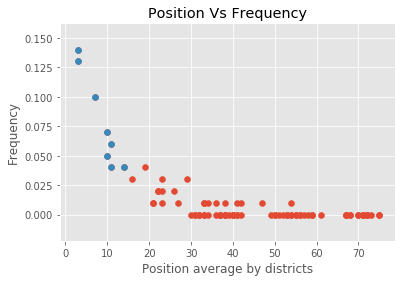

In [815]:
# Plotting a scatterplot of Position Vs Frequency
plt.scatter(rest_grouped['Position Average'], rest_grouped['Frequency'])
plt.scatter(freq_pos['Position Average'], freq_pos['Frequency'])
plt.xlabel('Position average by districts')
plt.ylabel('Frequency')
plt.title('Position Vs Frequency')
plt.savefig('subregion_plot.png', bbox_inches = 'tight')
plt.show()

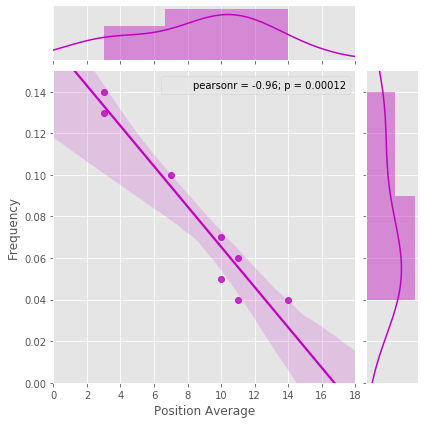

In [821]:
# To validate these categories the categories with correlation and a min p- value 
import scipy.stats as stats
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
#
p = sns.jointplot(freq_pos['Position Average'], freq_pos['Frequency'], kind="reg",
             truncate=False,xlim=(0, 18), ylim=(0,0.15),
                  color="m")
p.annotate(stats.pearsonr)
plt.show()

In [204]:
# Obtaining the main categories
unique_cat_r = freq_pos['Category'].to_list()
unique_cat_r

['Restaurant',
 'Seafood Restaurant',
 'Peruvian Restaurant',
 'Chinese Restaurant',
 'Fried Chicken Joint',
 'Bakery',
 'Burger Joint',
 'BBQ Joint']

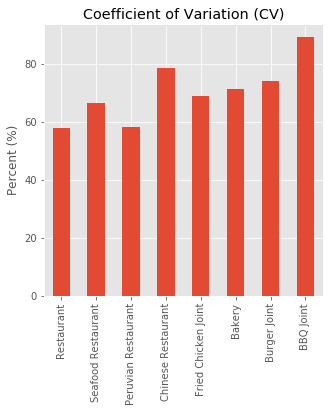

In [203]:
# Showing the Coefficient of Variation to evaluate the dispersion
cv=(lima_grouped.loc[:,unique_cat_r].describe().loc['std',:]/lima_grouped.loc[:,unique_cat_r].describe().loc['mean',:])*100
cv.plot(kind = 'bar', figsize = (5,5), rot = 90)
plt.title('Coefficient of Variation (CV)')
plt.ylabel('Percent (%)')
plt.show()

#### Interpreting results

In the case of the districts, we have a Position Vs Frequency scatterplot, in where the blue points are the 10% of the data that are above 90% of the frequency data (0.036) and that are below 10% of the average of positions (17). Of the Joint plot we know that these categories have a strongest negative correlation and a minimum p – value expected. 

We have a greater dispersion with respect to the frequency average due to positive bias that becomes more evident in the categories and also because there are districts with a much smaller sample from restaurants, especially in the case of small districts, a problem that por example, at the sub-regional level it would be hidden, despite this, the CV in the categories does not exceed 80% with exception of the BBQ Joint category, so that can be still considered as homogeneous categories  but with an frequency average with a low representation due to the high values that have.

#### Obtaining the main restaurant categories by subregions

In [23]:
# This dataframe is merged with the column of the subregion dataframe
lt = lima_grouped.merge(df[['DISTRITO','KEY']], on='DISTRITO')
#Group the datframe by subregions 
zones = lt.groupby('KEY').mean()
zones

,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,Belgian Restaurant,Bistro,Brazilian Restaurant,Breakfast Spot,Buffet,Burger Joint,Burrito Place,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Cantonese Restaurant,Caribbean Restaurant,Chinese Restaurant,Comfort Food Restaurant,Creperie,Cuban Restaurant,Deli / Bodega,Dim Sum Restaurant,Diner,Donut Shop,Empanada Restaurant,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Fondue Restaurant,Food,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Gastropub,German Restaurant,Gluten-free Restaurant,Hawaiian Restaurant,Hot Dog Joint,Indian Restaurant,Italian Restaurant,Japanese Restaurant,Kebab Restaurant,Korean Restaurant,Kosher Restaurant,Latin American Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Mongolian Restaurant,New American Restaurant,Noodle House,Paella Restaurant,Peruvian Restaurant,Pizza Place,Ramen Restaurant,Restaurant,Salad Place,Sandwich Place,Scandinavian Restaurant,Seafood Restaurant,Snack Place,Soup Place,South American Restaurant,Southern / Soul Food Restaurant,Spanish Restaurant,Steakhouse,Sushi Restaurant,Swiss Restaurant,Taco Place,Tapas Restaurant,Tex-Mex Restaurant,Thai Restaurant,Theme Restaurant,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wings Joint
KEY,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
CALLAO,0.007263,0.000000,0.000000,0.017388,0.023211,0.000000,0.061928,0.000000,0.000000,0.000000,0.012166,0.003322,0.076553,0.000680,0.025850,0.040816,0.006645,0.000000,0.003061,0.000680,0.069029,0.003322,0.000000,0.000000,0.018590,0.000000,0.010664,0.027551,0.000000,0.000000,0.014547,0.000000,0.004882,0.000000,0.000680,0.002041,0.000000,0.049323,0.000680,0.064969,0.004003,0.000000,0.000000,0.000000,0.000000,0.001361,0.019728,0.004003,0.000000,0.000000,0.000000,0.002381,0.000680,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.067529,0.043878,0.000000,0.093842,0.002381,0.006242,0.000000,0.187000,0.004683,0.000000,0.004202,0.000000,0.000000,0.003061,0.005442,0.000000,0.003061,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000680
CENTRAL LIMA,0.015568,0.000000,0.000000,0.012641,0.027429,0.000000,0.041721,0.000000,0.000000,0.000000,0.030847,0.003048,0.021570,0.000000,0.000874,0.017806,0.011687,0.000000,0.000000,0.000000,0.072805,0.000000,0.000000,0.000000,0.000874,0.000874,0.014332,0.004796,0.000000,0.000000,0.040587,0.000000,0.004717,0.000000,0.020790,0.011277,0.002174,0.010813,0.000874,0.101681,0.003497,0.000000,0.000000,0.000000,0.000000,0.000000,0.020964,0.011744,0.000000,0.000000,0.000000,0.019200,0.000000,0.004717,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.104186,0.026966,0.000000,0.105574,0.001748,0.032052,0.000000,0.127740,0.014773,0.007396,0.023545,0.000000,0.000000,0.003922,0.007765,0.000000,0.000000,0.000000,0.000874,0.000000,0.000000,0.000000,0.008293,0.000000,0.005260
LIMA ESTE,0.014013,0.002841,0.000000,0.027444,0.053073,0.000000,0.032070,0.000000,0.000000,0.000000,0.011453,0.000000,0.055652,0.001412,0.003356,0.020692,0.005475,0.001238,0.000000,0.000000,0.038310,0.007272,0.000000,0.001488,0.010243,0.000000,0.008271,0.005104,0.000000,0.000000,0.035277,0.000000,0.005817,0.001488,0.013401,0.005461,0.000000,0.017130,0.000000,0.079348,0.003831,0.000000,0.000000,0.000000,0.000000,0.000000,0.023627,0.001238,0.000000,0.000000,0.000000,0.022497,0.000000,0.000706,0.000000,0.000000,0.000000,0.000000,0.000000,0.002119,0.129658,0.047938,0.000000,0.158449,0.000706,0.012003,0.000000,0.085362,0.007779,0.007954,0.015133,0.001238,0.001488,0.002985,0.001488,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.003125,0.005860,0.000000,0.007488
LIMA NORTE,0.008935,0.000000,0.000000,0.024038,0.048023,0.000000,0.038312,0.000000,0.001330,0.013889,0.017950,0.002532,0.043731,0.001042,

In [32]:
# We must found the frequency  and join it with the position(in numbers from 1 to 85)
def return_freq_position_categories(df, num_top_categories):
    fd = []
    for i in range(len(df)):
        row = df.iloc[i,:]
        row_categories = row.iloc[:]
        row_categories_sorted = row_categories.sort_values(ascending=False)
        for n in range(num_top_categories):
            fd.append((row_categories_sorted.index[n],row_categories_sorted[n].round(2),n+1))
    return fd 
fqp = pd.DataFrame(return_freq_position_categories(zones, 85),
                   columns = ['Category','Frequency','Position Average'])
fqp.tail()

,Category,Frequency,Position Average
505,New American Restaurant,0.0,81
506,Filipino Restaurant,0.0,82
507,Food Stand,0.0,83
508,Cambodian Restaurant,0.0,84
509,Fondue Restaurant,0.0,85


In [33]:
# To obtain the total average of the position and frequency for each category
rest_subregion = fqp.groupby('Category').mean()
rest_subregion['Frequency'] = rest_subregion['Frequency'].astype(float).round(2)
rest_subregion['Position Average'] = rest_subregion['Position Average'].astype(int)
rest_subregion = rest_subregion.sort_values('Position Average', ascending = True).reset_index()
rest_subregion.head()

,Category,Frequency,Position Average
0,Seafood Restaurant,0.14,1
1,Restaurant,0.12,1
2,Peruvian Restaurant,0.10,3
3,Fried Chicken Joint,0.07,5
4,Chinese Restaurant,0.06,6


In [35]:
# Reducing to 10% of data to obtain the main categories
b_f = rest_subregion[rest_subregion['Frequency'] > rest_subregion['Frequency'].quantile(q = 0.9)]
fp_optimo=b_f[b_f['Position Average'] < rest_subregion['Position Average'].quantile(q = 0.1)]
fp_optimo = fp_optimo.reset_index().drop('index',1)
fp_optimo

,Category,Frequency,Position Average
0,Seafood Restaurant,0.14,1
1,Restaurant,0.12,1
2,Peruvian Restaurant,0.10,3
3,Fried Chicken Joint,0.07,5
4,Chinese Restaurant,0.06,6
5,Burger Joint,0.05,6
6,Bakery,0.04,7
7,BBQ Joint,0.04,8
8,Pizza Place,0.04,8


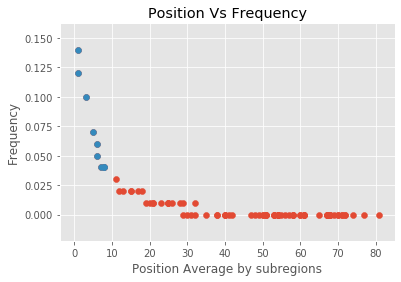

In [37]:
# Plotting a scatterplot of Position Vs Frequency
plt.scatter(rest_subregion['Position Average'], rest_subregion['Frequency'])
plt.scatter(fp_optimo['Position Average'], fp_optimo['Frequency'])
plt.xlabel('Position Average by subregions')
plt.ylabel('Frequency')
plt.title('Position Vs Frequency')
plt.savefig('rest_subregion.png', bbox_inches = 'tight')
plt.show()

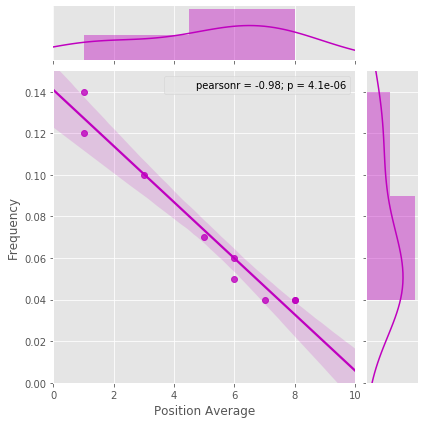

In [39]:
# To validate these categories the categories with correlation and a min p- value 
import scipy.stats as stats
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
#
p = sns.jointplot(fp_optimo['Position Average'], fp_optimo['Frequency'], kind="reg",
             truncate=False,xlim=(0, 10), ylim=(0,0.15),
                  color="m")
p.annotate(stats.pearsonr)
plt.savefig('joinplot_subregion.png', bbox_inches = 'tight')
plt.show()

In [45]:
# Main restaurant categories by zones
unique_cat = fp_optimo['Category'].to_list()

['Seafood Restaurant',
 'Restaurant',
 'Peruvian Restaurant',
 'Fried Chicken Joint',
 'Chinese Restaurant',
 'Burger Joint',
 'Bakery',
 'BBQ Joint',
 'Pizza Place']

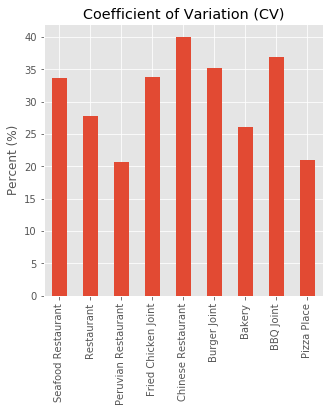

In [47]:
# Showing the Coefficient of Variation to evaluate the dispersion
cv=(zones.loc[:,unique_cat].describe().loc['std',:]/zones.loc[:,unique_cat].describe().loc['mean',:])*100
cv.plot(kind = 'bar', figsize = (5,5), rot = 90)
plt.title('Coefficient of Variation (CV)')
plt.ylabel('Percent (%)')
plt.savefig('cv_subregions.png', bbox_inches = 'tight')
plt.show()

#### Interpreting results

While in the subregions we have a Position Vs Frequency scatterplot, in where the blue points are the 10% of the data that are above 90% of the frequency data (0.036) and that are below 10% of the average of positions (9). 

Of the Joint plot we know that these categories have a stronger negative Pearson's correlation (-0.98) and a lower p-value (0.0000041), being better than the main categories by districts, regarding their dispersion they are considered homogeneous, being their maximum of CV the 40%  in the Chinese Restaurant category, what means  the restaurant categories have a good distribution in the subregions and a representative frequency average due to the high values that have decrease with at subregion level.

#### Heat Map of the  main restaurant categories

For now it is in our interest to visualize the main categories of restaurants on a map, for this we will make a heat map to observe the concentration of these throughout the Metroplitan in Lima

In [209]:
#Create folium maps
seafood_rest_map = folium.Map(location=[latitude, longitude], zoom_start=11)
peruvian_rest_map = folium.Map(location=[latitude, longitude], zoom_start=11)
restaurant_map = folium.Map(location=[latitude, longitude], zoom_start=11)
burger_joint_map = folium.Map(location=[latitude, longitude], zoom_start=11)
chinese_rest_map = folium.Map(location=[latitude, longitude], zoom_start=11)
bbq_rest_map = folium.Map(location=[latitude, longitude], zoom_start=11)
fcj_rest_map = folium.Map(location=[latitude, longitude], zoom_start=11)
pizza_map = folium.Map(location=[latitude, longitude], zoom_start=11)
bakery_map = folium.Map(location=[latitude, longitude], zoom_start=11)

In [210]:
rest_cat = [seafood_rest_map, restaurant_map, peruvian_rest_map,
            fcj_rest_map, chinese_rest_map, burger_joint_map, bakery_map, bbq_rest_map,
            pizza_map] 

In [211]:
unique_cat

['Seafood Restaurant',
 'Restaurant',
 'Peruvian Restaurant',
 'Fried Chicken Joint',
 'Chinese Restaurant',
 'Burger Joint',
 'Bakery',
 'BBQ Joint',
 'Pizza Place']

In [212]:
# Plotting map to visualize it
import folium # map rendering library
from folium.plugins import HeatMap
def heatmapping(folium_map, category):
    ## add geometry extent
    for polygon in district_ext:
        polygon.add_to(folium_map) 
    category_rest = df_rest[df_rest['Restaurant Category'] == category]
    heat_data = [[row['Restaurant Latitude'],row['Restaurant Longitude'],]
                 for index, row in category_rest.iterrows()]
    # Plot it on the map
    HeatMap(heat_data, radius = 10).add_to(folium_map)  
    return folium_map    

#### Seafood Restaurant Category

In [213]:
heatmapping(rest_cat[0], unique_cat[0])

#### Restaurant Category

In [214]:
heatmapping(rest_cat[1], unique_cat[1])

#### Peruvian Restaurant Category

In [215]:
heatmapping(rest_cat[2], unique_cat[2])

#### Fried Chicken Joint Category

In [216]:
heatmapping(rest_cat[3], unique_cat[3])

#### Chinese Restaurant Category

In [217]:
heatmapping(rest_cat[4], unique_cat[4])

#### Burger Joint Category

In [218]:
heatmapping(rest_cat[5], unique_cat[5])

#### Bakery Category

In [219]:
heatmapping(rest_cat[6], unique_cat[6])

#### BBQ Joint Category

In [220]:
heatmapping(rest_cat[7], unique_cat[7])

#### Pizza Place Category

In [221]:
heatmapping(rest_cat[8], unique_cat[8])

## Clustering Model <a name="clustering"></a>

In this section, we'll talk a little bit about the machine learning algorithm to answer this question:
Is it possible to group the metropolitan districts of Lima according to these categories?

To start, we will use the clustering algorithm called K-Means that make the districts is grouping according to their closest mean value (of frequency of their categories), this method is one of the most common in clustering. 

### Linear Dimensionality Reduction

Doing an overview, our data frame contains 85 categories and 50 records  from districts, if we want to group the districts with respect to all the categories,  we would be facing a great problem since in spaces of very high dimensions (more than eighty in this case), Euclidean distances tend to inflate (this is an instance of the so-called "dimensionality curse"). For it, a good solution is to run a dimensionality reduction algorithm with the Principal Component Analysis (PCA) to obtain a simplest form (in 2-D) and better work with the clustering algorithm.

The PCA with Singular Value Decomposition is a linear dimensionality reduction in where the axis are the Principal Components that are adjusted and oriented towards where the variance is maximum, through Sum of Square Distances (SSD), and are used the two components, with more variance accounted, as axes in the algorithm normalized by the Singular Value Decomposition.

In [88]:
lima_grouped_clustering = lima_grouped.drop('DISTRITO', 1)

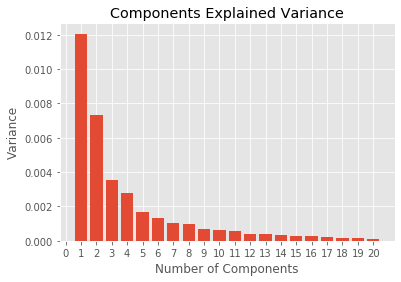

In [124]:
# To obtain the variance of the first 20 components  
from sklearn.decomposition import PCA
X = np.array(lima_grouped_clustering)
pca = PCA(n_components=20)
X_r = pca.fit(X).transform(X)
Nc = range(1, 21)
# The graph is plotted to observe the variance distribution in components
plt.bar(Nc,pca.explained_variance_)
plt.xticks(range(0,21))
plt.xlabel('Number of Components')
plt.ylabel('Variance')
plt.title('Components Explained Variance')
plt.savefig('PCA.png',bbox_inches = 'tight')
plt.show() #4

In [91]:
from sklearn.decomposition import PCA
X = np.array(lima_grouped_clustering)
pca = PCA(n_components=2) # The two Pc with the maximum variation
X_r = pca.fit(X).transform(X)

### Code lines of Optimal K Choice

In [92]:
# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

# import k-means from clustering stage
from sklearn.cluster import KMeans

### Internal validation metrics to choose of the optimal k

Next to reduce the dimension of our data at two dimension, the kmeans clustering is easy, but how k we choose it? We have a answer, for this case we do not know the outcomes of cluster labels, then we only have to evaluate the clusters internally through the internal validation metrics.
Let's get started, there are two types of metrics in any clustering: Cohesion and separation 

#### Cohesion by Within- Cluster - Sum of Squares

Cohesion means that objects of the same cluster are the most similar possible (closest to center value) this can be measured with  Within-Cluster-Sum of Squared (WSS) that is the sum of the square distances of the point from its predicted cluster center and the optimal k is choose according to the elbow method.

In this case, the optimal k according to elbow method would be four or eight


In [93]:
from sklearn.cluster import KMeans

# function returns WSS score for k values from 1 to kmax
def calculate_SSW(X_r, kmax):
    sse = []
    for k in range(1, kmax+1):
        kmeans = KMeans(n_clusters = k).fit(X_r)
        centroids = kmeans.cluster_centers_
        pred_clusters = kmeans.predict(X_r)
        curr_sse = 0
    
    # calculate square of Euclidean distance of each point from its cluster center and add to current WSS
        for i in range(len(X_r)):
                curr_center = centroids[pred_clusters[i]]
                for e in range(X_r.shape[1]):
                    curr_sse += (((X_r[i,e]) - curr_center[e]) ** 2) 
        sse.append(curr_sse) 
    return sse       

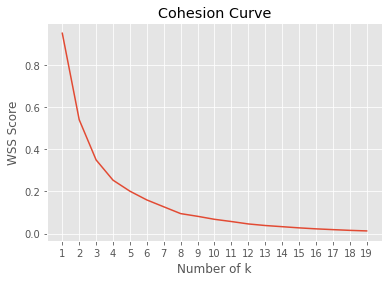

In [100]:
Nc = range(1, 20)
kmax = 19
plt.plot(Nc,calculate_SSW(X_r,kmax))
plt.xlabel('Number of k')
plt.ylabel('WSS Score')
plt.xticks(range(1, 20))
plt.title('Cohesion Curve')
plt.savefig('elbow method.png', bbox_inches = 'tight')
plt.show() #4

### Separation by Between- Clusters- Sum of Squares

Separation means that clusters must be widely separated between them, A measurement of separation used to evaluate the intercluster distance is Between-Cluster-Sum of Squared (WSS) that is the sum of the square distances of the cluster centers with the mean of objects multiply by its object number, while longer distance, the clustering will be better.

In this case, the optimal k would be when BSS is high for example six or eight

In [101]:
#Calculate the overall mean
mean = 0
for i in range(len(X_r)):
            mean += X_r[i]/len(X_r)
mean        

array([-3.41523684e-17,  1.06251813e-17])

In [114]:
# function returns SSB score for k values from 1 to kmax
def calculate_BSS(X_r, kmax):
    ssb = []
    for k in range(1, kmax+1):
        kmeans = KMeans(n_clusters = k).fit(X_r)
        centroids = kmeans.cluster_centers_
        pred_clusters = kmeans.predict(X_r)
        curr_ssb = 0
    # calculate square of  distance of center point to mean of dataset multiply by the number of clusters
        for i in range(len(X_r)):
            curr_center = centroids[pred_clusters[i]]
            for e in range(X_r.shape[1]):
                curr_ssb += ((curr_center[e] - mean[e]) ** 2) * list(pred_clusters).count(i) 
        ssb.append(curr_ssb) 
    return ssb

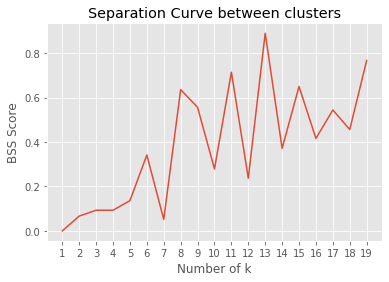

In [115]:
Nc = range(1, 20)
max = 19
plt.plot(Nc,calculate_SSB(X_r,kmax))
plt.xlabel('Number of k')
plt.ylabel('BSS Score')
plt.xticks(range(1,20))
plt.title('Separation Curve between clusters')
plt.savefig('separation method.png', bbox_inches = 'tight')
plt.show() #5

### Internal Indexes

Davies Bouldin Index and Silhouette Coefficient are the two main internal metrics 

#### Davies Bouldin Index

Davies Bouldin Index is calculated by the summation divided by the cluster numbers of maximum distances of the average of the distances between the points of the cluster "i" with the cluster "j" divided by the intercluster distance

In [116]:
from sklearn.metrics import davies_bouldin_score
dbs = []
kmax = 19
# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(2, kmax+1):
        kmeans = KMeans(n_clusters = k).fit(X_r)
        labels = kmeans.labels_
        dbs.append(davies_bouldin_score(X_r, labels))

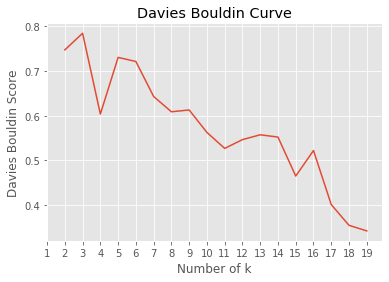

In [117]:
Nc = range(2, 20)
plt.plot(Nc,dbs)
plt.xticks(range(1,20))
plt.xlabel('Number of k')
plt.ylabel('Davies Bouldin Score')
plt.title('Davies Bouldin Curve')
plt.savefig('Davies Buildin.png', bbox_inches = 'tight')
plt.show() # 4

### Silhoutte Coefficient

Silhouette Coefficient is defined as:


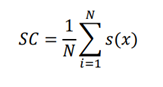


Where s(x) is the difference of b(x) and a(x) divided by the maximum of b(x) and a(x)
 
And b(x) is the average distance from “x” point to all other points in the
same cluster and a(x) is the average distance from “x” point to all other points in the closest clusters.

From this curve, the optimal k without doubt is four since the Silhouette coefficient is between -1 and 1 in where the greatest value close to one is taken as optimal


In [118]:
from sklearn.metrics import silhouette_score
sil = []
kmax = 19
# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(2, kmax+1):
        kmeans = KMeans(n_clusters = k).fit(X_r)
        labels = kmeans.labels_
        sil.append(silhouette_score(X_r, labels, metric = 'euclidean'))

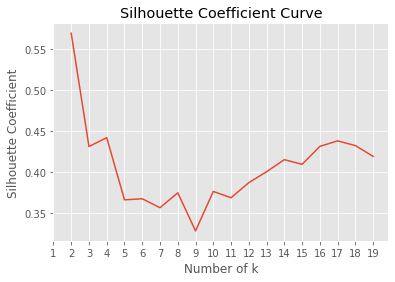

In [123]:
Nc = range(2, 20)  #4
plt.plot(Nc,sil)
plt.xticks(range(1,20))
plt.xlabel('Number of k')
plt.ylabel('Silhouette Coefficient')
plt.title('Silhouette Coefficient Curve')
plt.savefig('Silhoutte.png', bbox_inches = 'tight')
plt.show()

In [125]:
# Running a K- Mean Clustering algorithm with four clusters
kmeans = KMeans(n_clusters = 4).fit(X_r)
pred_clusters = kmeans.predict(X_r)

explained variance: [0.0120609  0.00733393]


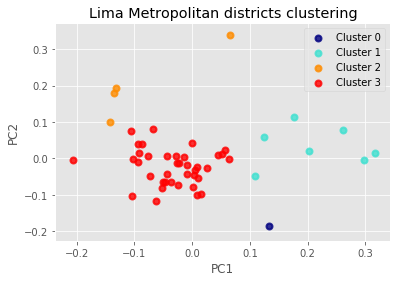

In [131]:
print('explained variance: %s'
      % str(pca.explained_variance_[0:2]))
plt.figure()
colors = ['navy', 'turquoise', 'darkorange','red']
clusters = ['Cluster 0','Cluster 1','Cluster 2','Cluster 3']
lw = 2
for color, i, target_name in zip(colors, [0, 1, 2, 3], clusters):
    plt.scatter(X_r[pred_clusters == i, 0], X_r[pred_clusters == i, 1], color=color, alpha=.8, lw=lw,
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('Lima Metropolitan districts clustering')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.savefig('PCAClustering.png', bbox_inches = 'tight')
plt.show()

### K- Means Clustering

In [132]:
# set number of clusters
kclusters = 4
# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(X_r)
# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([1, 1, 1, 1, 3, 1, 1, 2, 3, 1])

In [137]:
# add clustering labels
restaurant_sorted.insert(0, 'Cluster Label', kmeans.labels_)

lima_merged = lima_callao

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
lima_merged = lima_merged.join(restaurant_sorted.set_index('DISTRITO'), on='DISTRITO')
lima_merged.head()# check the last columns!

,DISTRITO,SHAPE,Cluster Label,1st Most Common Category,2nd Most Common Category,3rd Most Common Category,4th Most Common Category,5th Most Common Category
0,LURIN,"{'rings': [[[-76.70548923599995, -12.176723729...",3,Peruvian Restaurant,BBQ Joint,Restaurant,Seafood Restaurant,Diner
1,ANCON,"{'rings': [[[-77.06516666449812, -11.575122912...",1,Peruvian Restaurant,Seafood Restaurant,Restaurant,Fried Chicken Joint,Fish & Chips Shop
2,SAN ISIDRO,"{'rings': [[[-77.04858598599986, -12.085040979...",1,Peruvian Restaurant,Restaurant,Seafood Restaurant,Café,Chinese Restaurant
3,MAGDALENA DEL MAR,"{'rings': [[[-77.07210348599989, -12.083583979...",1,Seafood Restaurant,Bakery,Fried Chicken Joint,Italian Restaurant,Burger Joint
4,SAN BORJA,"{'rings': [[[-76.98731636099996, -12.079939479...",1,Chinese Restaurant,Seafood Restaurant,Restaurant,Bakery,Sushi Restaurant


### Map K - Means Clusters

In [144]:
# We define the color for each cluster label
cluster_colors =  { 0 : 'green',
                    1 : 'red',
                    2 : 'gray',
                    3 : 'blue',}
def color_producer(attribute):
     return cluster_colors[attribute] 
col = []
for i in range(len(lima_merged)):
    col.append(color_producer(lima_merged['Cluster Label'][i]))
    ## Modify the style of each districts
out_sf = []    
for colour in  col:  
    style_function= lambda feature, fillColor = colour, color=colour: dict(
                    color = color,
                    fillColor = color,
                     weight=1.5, opacity=0.5, fillOpacity = 0.12)               
    out_sf.append(style_function)
    ## To assign text of the cluster labels to tooltip    
text = []
for i in range(len(lima_merged)):    
    text.append(str(lima_merged['DISTRITO'][i]) + ' CLUSTER ' + str(lima_merged['Cluster Label'][i]))
lima_merged['TEXT'] = text    

# To obtain extent, tooltip and style of each district
import folium
districts_ext = []
for i in range(len(lima_merged)):
    districts_ext.append(folium.features.GeoJson(GeoSeriesAccessor(lima_merged.SHAPE).as_shapely[i], 
                                                tooltip = lima_merged['TEXT'][i],
                                                style_function = out_sf[i]))  
    

In [145]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)
for polygon in districts_ext:
    polygon.add_to(map_clusters)     
map_clusters

## Results and Discussion <a name="results"></a>

Once selected the districts, we need a sample of restaurants to analyze, for this reason we create uniform fishnet points with 108 rows and 109 columns over Lima Metropolitan area, giving a total of  4,964 points according to Rate Limits in Foursquare. The radius of 1250 meters assigned to completely cover the Lima Metropolitan area would be deficient to take a sample of restaurants of small districts. 

About the sample, knowing from the heat maps that Metropolitan Lima is also centralized, creating a network of points in the main centers of 

Metropolitan Lima to obtain a much larger sample would be a good method, although it is far from the main focus of the project.
Our random sample of 5,188 restaurants representing approximately 5% of restaurants in Metropolitan Lima, were identified 85 types or restaurant categories.

We find that certain categories have high frequency values and many categories with low values, this creating a positive bias in the distribution of restaurant categories. 

In the case of districts we have a greater dispersion with respect to the frequency average due to positive bias that becomes more evident in the categories and also because there are districts with a much smaller sample from restaurants, especially in the case of small districts, a problem that por example, at the sub-regional level it would be hidden, despite this, the CV in the categories does not exceed 80% with exception of the BBQ Joint category, so that can be still considered as homogeneous categories  but with an frequency average with a low representation.

The main categories are almost the same between districts and subregions  with exception to Pizza Place Category are present in the main categories by subregions, the heat maps made for each one indicate the distribution of the main categories in the Lima Metropolitan area, where  is observed a large concentration of restaurant categories throughout the Residential and Central Lima though also in the large urban and commercial centers of Lima Norte, Sur, Este and Callao

After dimensionally reducing our data set and evaluating its optimal k, the result gave us a classification with four clusters. But what does it mean?

The cluster 0 (turquoise in the map) is made up by south Lima Metropolitan districts with extensive coastal areas  and known for their holiday resorts and beaches and La Punta, have like main categories the Seafood Restaurant (all in the first position), Bakery and Pizza Place. 

In [223]:
lima_merged.loc[lima_merged['Cluster Label'] == 0, lima_merged.columns[[0] + list(range(2, lima_merged.shape[1]))]]

,DISTRITO,Cluster Label,1st Most Common Category,2nd Most Common Category,3rd Most Common Category,4th Most Common Category,5th Most Common Category,TEXT
8,LA PUNTA,0,Seafood Restaurant,Pizza Place,Restaurant,Bakery,Italian Restaurant,LA PUNTA CLUSTER 0
12,PUCUSANA,0,Seafood Restaurant,Latin American Restaurant,Italian Restaurant,Restaurant,Cajun / Creole Restaurant,PUCUSANA CLUSTER 0
13,SANTA MARIA DEL MAR,0,Seafood Restaurant,Pizza Place,Restaurant,Deli / Bodega,Middle Eastern Restaurant,SANTA MARIA DEL MAR CLUSTER 0
20,PUNTA NEGRA,0,Seafood Restaurant,Restaurant,Peruvian Restaurant,Bakery,Burger Joint,PUNTA NEGRA CLUSTER 0
25,PUNTA HERMOSA,0,Seafood Restaurant,Restaurant,Sandwich Place,Bakery,Pizza Place,PUNTA HERMOSA CLUSTER 0
26,SAN BARTOLO,0,Seafood Restaurant,Pizza Place,Restaurant,Burger Joint,Italian Restaurant,SAN BARTOLO CLUSTER 0


The second cluster 1 (red in the map) is the most extent cluster with almost the 60% of districts and is made up by central Lima Metropolitan and the larger and commercial urban centers.
In this cluster, we see the rise of fast food categories like Burger and Fried Chicken Joint as well as BBQ Joint and Chinese Restaurant, but with a clear predominance of Seafood and Peruvian Restaurant

In [224]:
lima_merged.loc[lima_merged['Cluster Label'] == 1, lima_merged.columns[[0] + list(range(2, lima_merged.shape[1]))]]

,DISTRITO,Cluster Label,1st Most Common Category,2nd Most Common Category,3rd Most Common Category,4th Most Common Category,5th Most Common Category,TEXT
1,ANCON,1,Peruvian Restaurant,Seafood Restaurant,Restaurant,Fried Chicken Joint,Fish & Chips Shop,ANCON CLUSTER 1
2,SAN ISIDRO,1,Peruvian Restaurant,Restaurant,Seafood Restaurant,Café,Chinese Restaurant,SAN ISIDRO CLUSTER 1
3,MAGDALENA DEL MAR,1,Seafood Restaurant,Bakery,Fried Chicken Joint,Italian Restaurant,Burger Joint,MAGDALENA DEL MAR CLUSTER 1
4,SAN BORJA,1,Chinese Restaurant,Seafood Restaurant,Restaurant,Bakery,Sushi Restaurant,SAN BORJA CLUSTER 1
5,LINCE,1,Seafood Restaurant,Peruvian Restaurant,Restaurant,Italian Restaurant,Food Truck,LINCE CLUSTER 1
6,SANTIAGO DE SURCO,1,Chinese Restaurant,Restaurant,Seafood Restaurant,Burger Joint,Bakery,SANTIAGO DE SURCO CLUSTER 1
7,PUEBLO LIBRE,1,Chinese Restaurant,Burger Joint,Restaurant,Pizza Place,Café,PUEBLO LIBRE CLUSTER 1
10,CARABAYLLO,1,Restaurant,Fried Chicken Joint,Chinese Restaurant,Peruvian Restaurant,Burger Joint,CARABAYLLO CLUSTER 1
11,JESUS MARIA,1,Peruvian Restaurant,Chinese Restaurant,Restaurant,Seafood Restaurant,Bakery,JESUS MARIA CLUSTER 1
14,CHORRILLOS,1,Seafood Restaurant,Restaurant,Fried Chicken Joint,Peruvian Restaurant,Pizza Place,CHORRILLOS CLUSTER 1


The third cluster 2 (gray in the map) only contains a district but looking the   five first position of its categories we could integrate it into the first cluster. But keep in mind that is a small district, the sample taken from this district was lower than the others, making the value of the frequencies in these categories low and does not fitted in any other cluster.

In [226]:
lima_merged.loc[lima_merged['Cluster Label'] == 2, lima_merged.columns[[0] + list(range(2, lima_merged.shape[1]))]]

,DISTRITO,Cluster Label,1st Most Common Category,2nd Most Common Category,3rd Most Common Category,4th Most Common Category,5th Most Common Category,TEXT
34,CARMEN DE LA LEGUA REYNOSO,2,Pizza Place,Bakery,Seafood Restaurant,Café,Cafeteria,CARMEN DE LA LEGUA REYNOSO CLUSTER 2


The last cluster 3(blue in the map) is made up by Southeast and two northern metropolitan districts that in which predominate the Peruvian and common restaurant categories with a great presence of the fast food categories. 

In [176]:
lima_merged.loc[lima_merged['Cluster Label'] == 2, lima_merged.columns[[0] + list(range(2, lima_merged.shape[1]))]].to_csv('cluster2.csv',sep = "/", index = False)

## Conclusion<a name="conclusion"></a>

In conclusion we will answer the three questions of the project.
How much do we know about these categories and their distribution in our metropolitan area?  Which are the mains?


From our analyzed sample (which represents 5% of the restaurants in Metropolitan Lima) we have noticed that there are few categories of restaurants that concentrate a large part of the sector: Seafood, Peruvian and Common Restaurant are undoubtedly the main ones and as a replacement for We have BBQ Joint, Bakery and Chinese Restaurant, but it should be noted that the fast food sector is well represented in the Metropolitan area with categories such as Burger, Fried Chicken Joint and Pizza Place. After these we only have unrepresentative and even sporadic categories.


Is it possible to classify the metropolitan districts of Lima according to these categories?
Sure, in this project we have made the classification of Metropolitan Lima through k-means clustering where the most optimal k validated internally was chosen. Which resulted in a satisfactory classification.
